# IMPORT DEPENDENCIES:

In [478]:
import cv2
import numpy as np
import glob
import matplotlib.pyplot as plt
import math

from os import walk

In [479]:
'''
Change font for visualization:
'''

font = {'family' : 'Arial',
        'weight' : 'bold',
        'size'   : 22}

plt.rc('font', **font)

# ENVIRONMENT VARIABLES:

In [480]:
PATH_BASE="."
PATH_DATA=f"{PATH_BASE}/data"
PATH_DATA_SET_001=f"{PATH_DATA}/set001"
PATH_DATA_SET_002=f"{PATH_DATA}/set002"

# I. GENERAL:
- Used for both dataset.

In [569]:
def load_images_from_dir(path):
    image_paths=glob.glob(f"{path}/*")
    images=[cv2.cvtColor(cv2.imread(image_path) ,cv2.COLOR_BGR2RGB) for image_path in image_paths]
    return images

def display(images,cmap=None,titles=None):
    plt.figure(figsize=(20, 20))
    for i in range(len(images)):
        idx=i+1
        ax = plt.subplot(2, 2, idx)
        plt.imshow(images[i],cmap=cmap)
        if titles:
            plt.title(titles[idx-1])
        plt.axis("off")
        
def to_gray(image):
    return cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

def to_bin(image):
    _, im_bw=cv2.threshold(image,None,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    return im_bw

def to_bin_partly(image,num_parts=10):
    num_rows=image.shape[0]
    num_rows_per_part=math.floor(num_rows/num_parts)
    parts=[]
    for i in range(num_parts):
        if i != num_parts-1:
            partial_image=image[i*num_rows_per_part:(i+1)*num_rows_per_part,:]
        else:
            partial_image=image[i*num_rows_per_part:,:]
        bin_partial_image=to_bin(partial_image)
        parts.append(bin_partial_image)
    parts=tuple(parts)
    res=np.concatenate(parts, axis=0)
    return res

def count_from_bin(image):
    image=np.uint8(image)
    num_labels, _ = cv2.connectedComponents(image)
    return num_labels - 1

# II. SET I:

# II.1. UTILS:

In [482]:
def remove_salt_pepper_noise(image):
    ksize=3
    return cv2.medianBlur(image,ksize)

def find_sym(point, point_list,origin):
    sym_point=np.subtract(np.array(origin)*2,point)
    for p in point_list:
        if (sym_point==p).all():
            return sym_point
    return np.empty([0,0])

def check_sym(point_list,origin=[230,230]):
    res=[]
    for i in range(len(point_list)-1):
        point=point_list[i,:]
        sym_point=find_sym(point,point_list[i+1:,:],origin)
        if len(sym_point):
            res.append(point)
            res.append(sym_point)
    return res

def remove_periodic_noises(img):
    dft = cv2.dft(np.float32(img), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)
    magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]))
    
    rows, cols = img.shape
    crow, ccol = int(rows / 2), int(cols / 2)
    mask = np.ones((rows, cols, 2), np.uint8)
    
    image_max = ndi.maximum_filter(magnitude_spectrum, size=5, mode='constant')
    coordinates = peak_local_max(magnitude_spectrum, min_distance=5)
    cs=check_sym(coordinates)
    for c in cs:
        if c[0]==230:
            mask[c[0],c[1]]=[0,0]

    fshift = dft_shift * mask
    fshift_mask_mag = 20 * np.log(cv2.magnitude(fshift[:, :, 0], fshift[:, :, 1]))
    f_ishift = np.fft.ifftshift(fshift)
    img_back = cv2.idft(f_ishift)
    img_back = cv2.magnitude(img_back[:, :, 0], img_back[:, :, 1])
    return img_back

def standardize(image): 
    shift=image if image.min() >= 0 else image + abs(image.min())
    res=(shift/shift.max())*255.0
    res=np.uint8(res)
    return res

def erode(image):
    kernel=np.array([[0,1,0],[1,1,1],[0,1,0]],np.uint8)
    im_bw = cv2.erode(image,kernel,iterations = 2)
    return im_bw

# II.2. TEST: 

# (1) LOAD IMAGES:

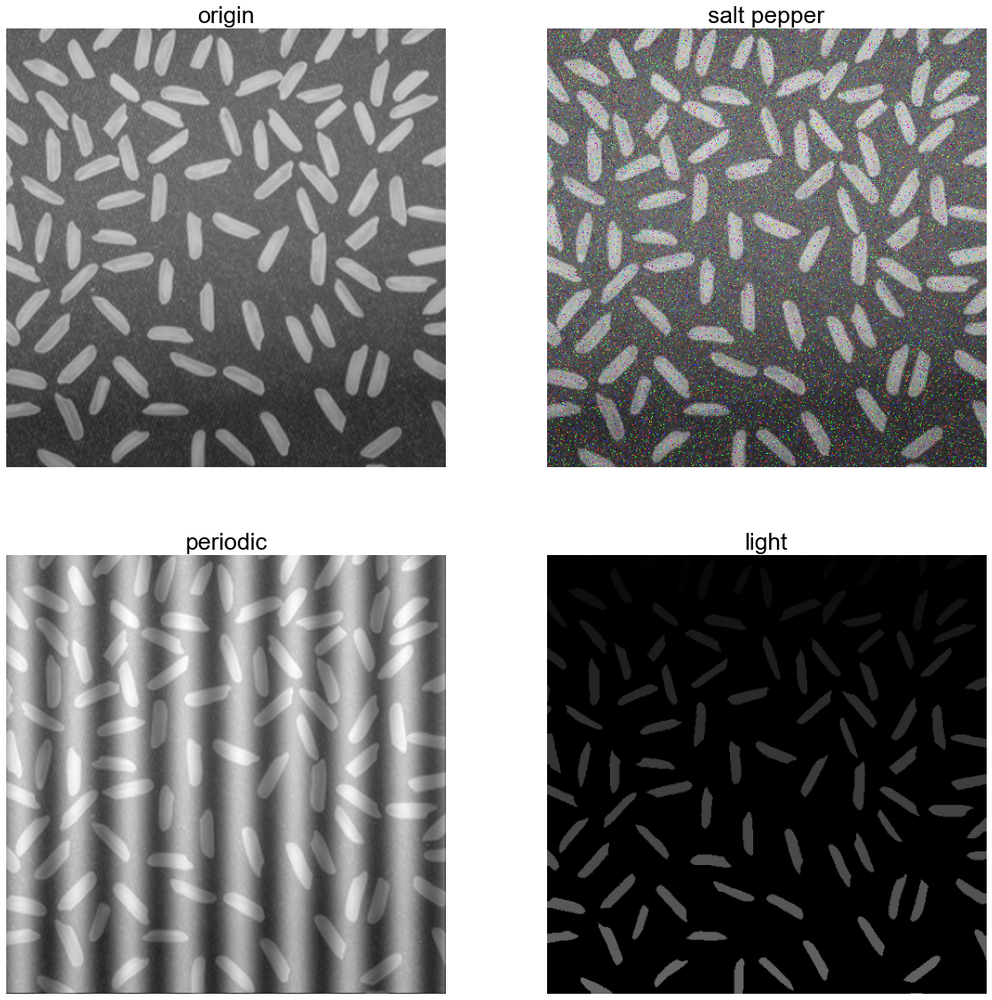

In [520]:
names=["origin", "salt pepper", "periodic", "light"]

images=load_images_from_dir(PATH_DATA_SET_001)
display(images,None,names)

# (2) CONVERT TO GRAYSCALE:

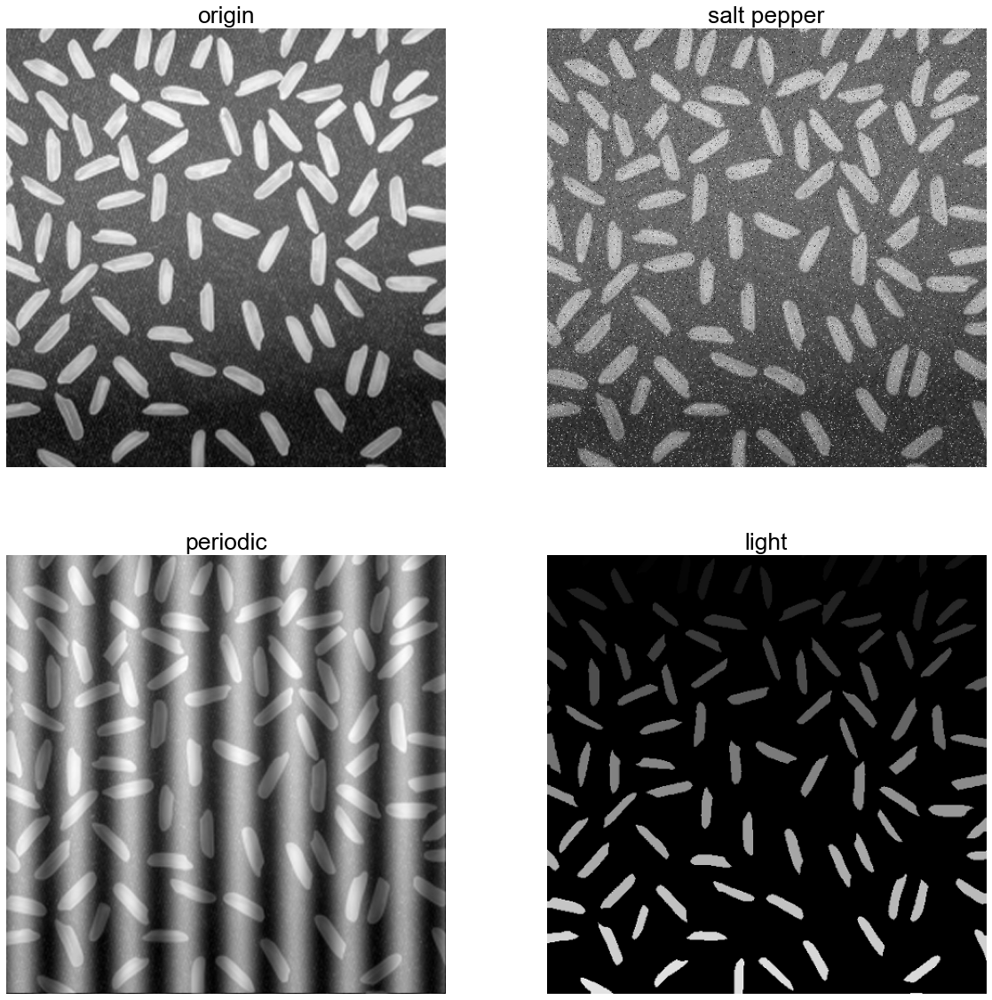

In [521]:
gray_images=[to_gray(image) for image in images]
display(gray_images,"gray",names)

# (3) REMOVE SALT PEPPER NOISE:

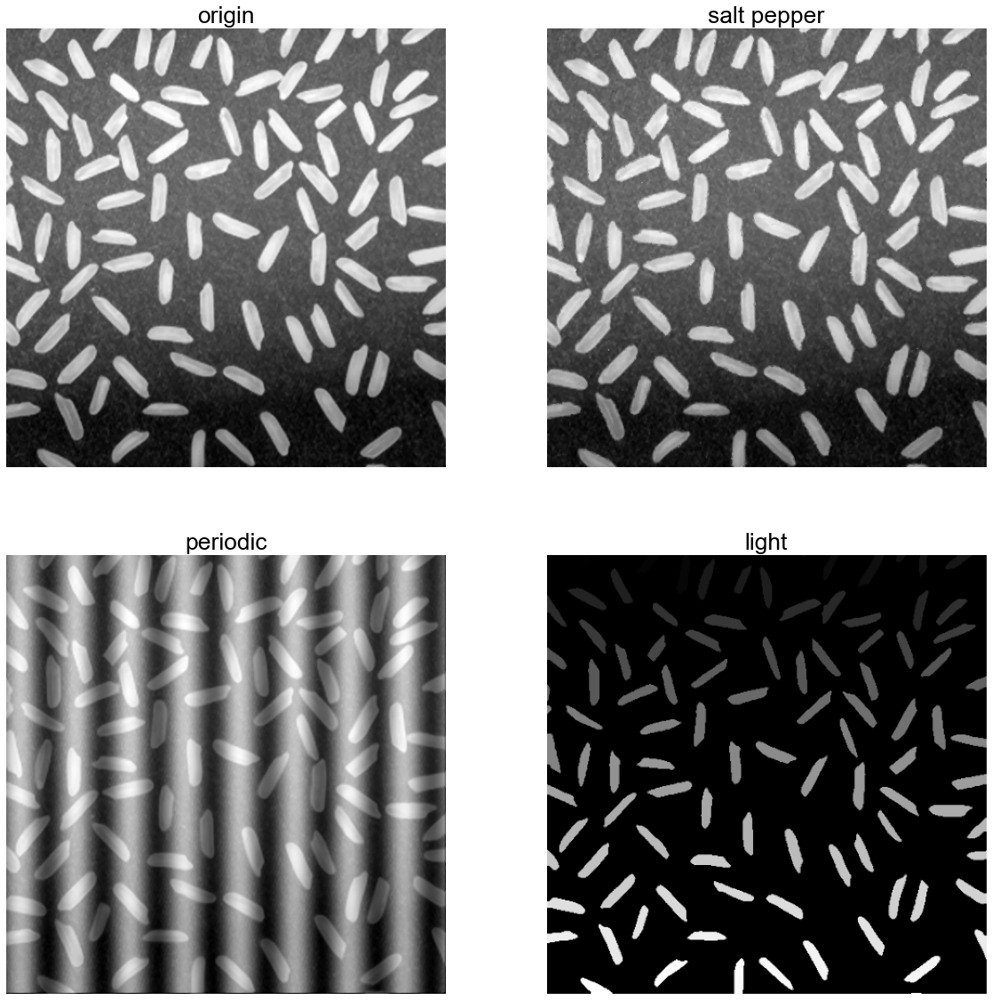

In [522]:
non_salt_pepper_images=[remove_salt_pepper_noise(image) for image in gray_images]
display(non_salt_pepper_images,"gray",names)

# (4) REMOVE PERIODIC NOISE:

D:\Users\User\anaconda3\envs\HIPC\lib\site-packages\ipykernel_launcher.py:39: RuntimeWarning: divide by zero encountered in log


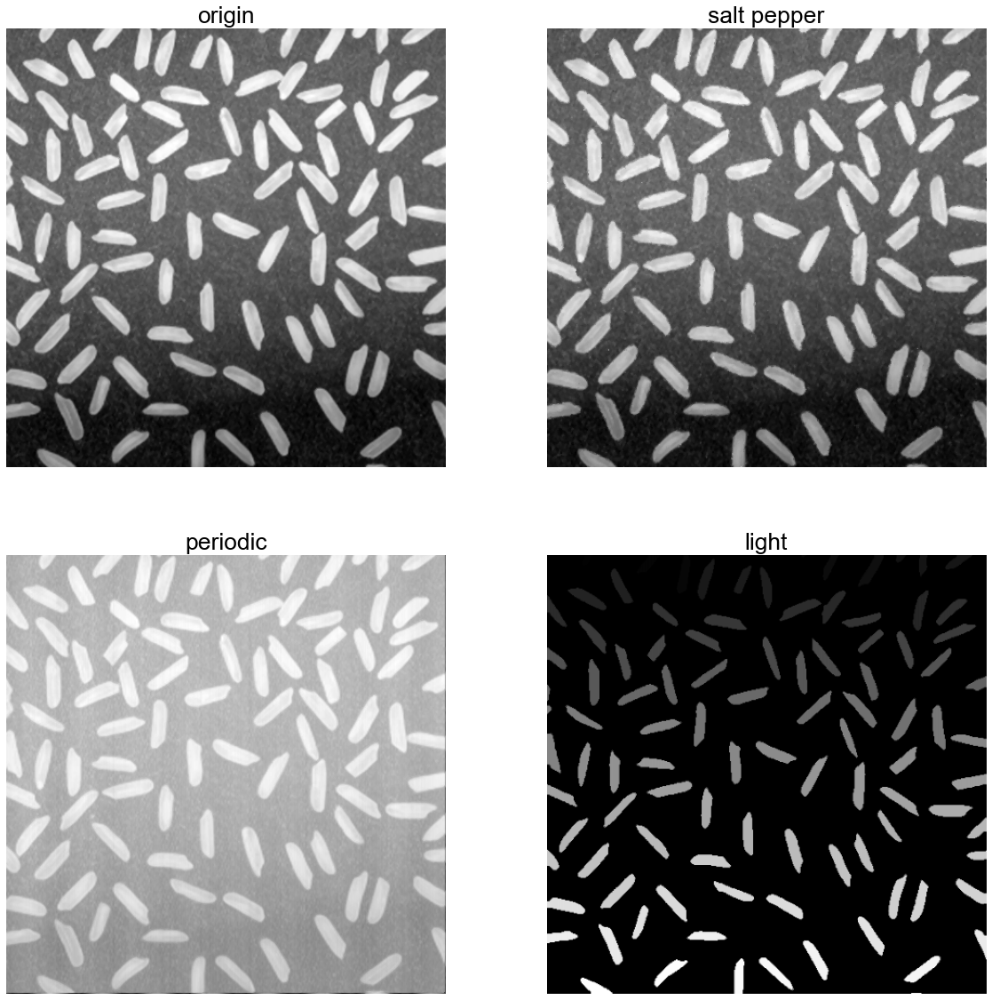

In [525]:
non_periodic_images=[remove_periodic_noises(image) for image in non_salt_pepper_images]
display(non_periodic_images,"gray",names)

# (5) STANDARDIZE: 
- [0; 255]

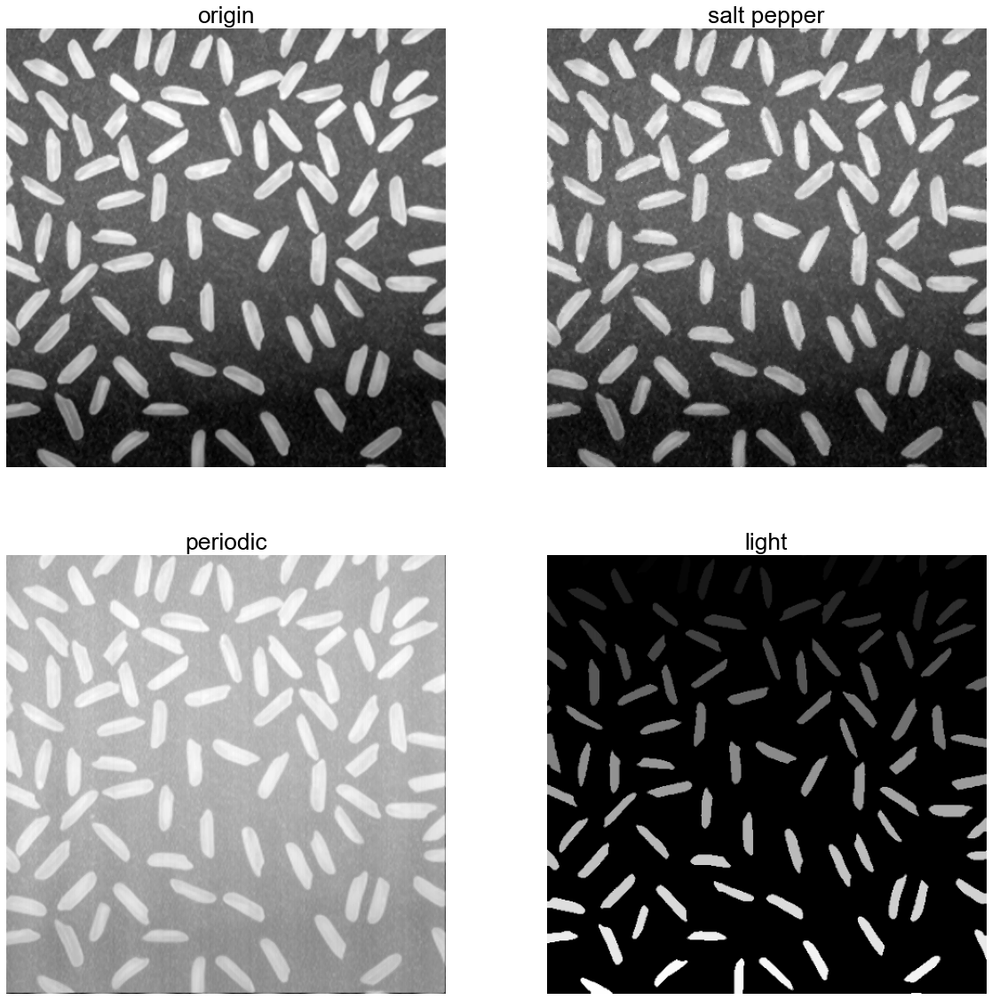

In [526]:
standardizeds=[standardize(image) for image in non_periodic_images]
display(standardizeds,"gray",names)

# (6) CONVERT TO BINARY IMAGES:

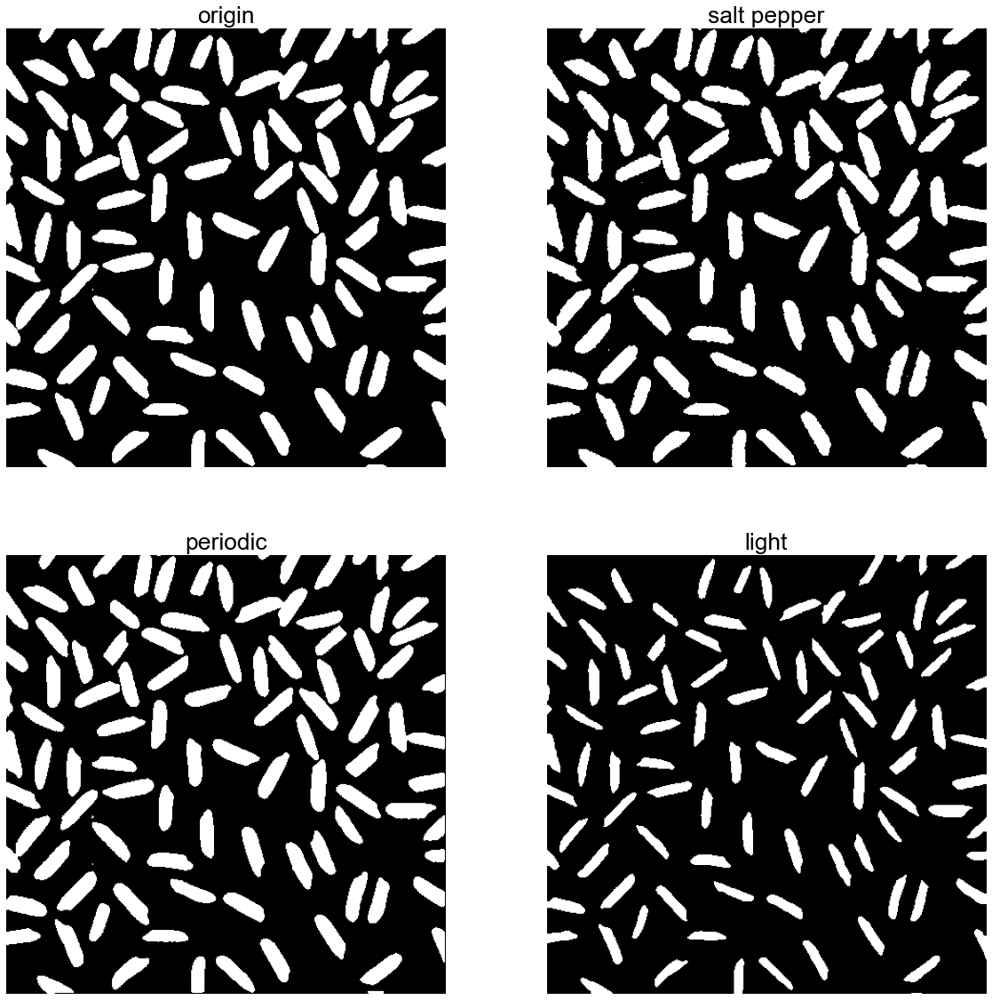

In [554]:
bin_images=[to_bin_partly(image) for image in standardizeds]
display(bin_images,"gray",names)

# (7) ERODE: 

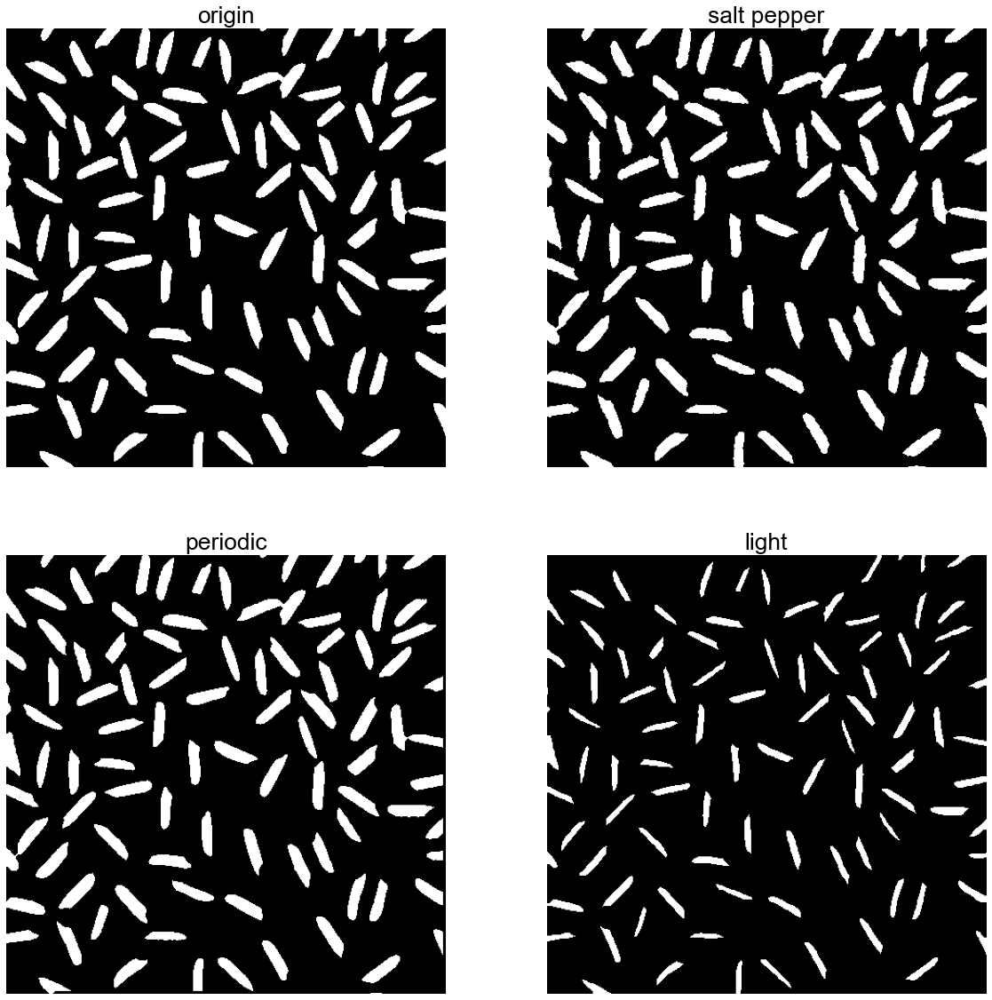

In [555]:
bin_images=[erode(image) for image in bin_images]
display(bin_images,"gray",names)

# (8) COUNT: 
- Count connected components.

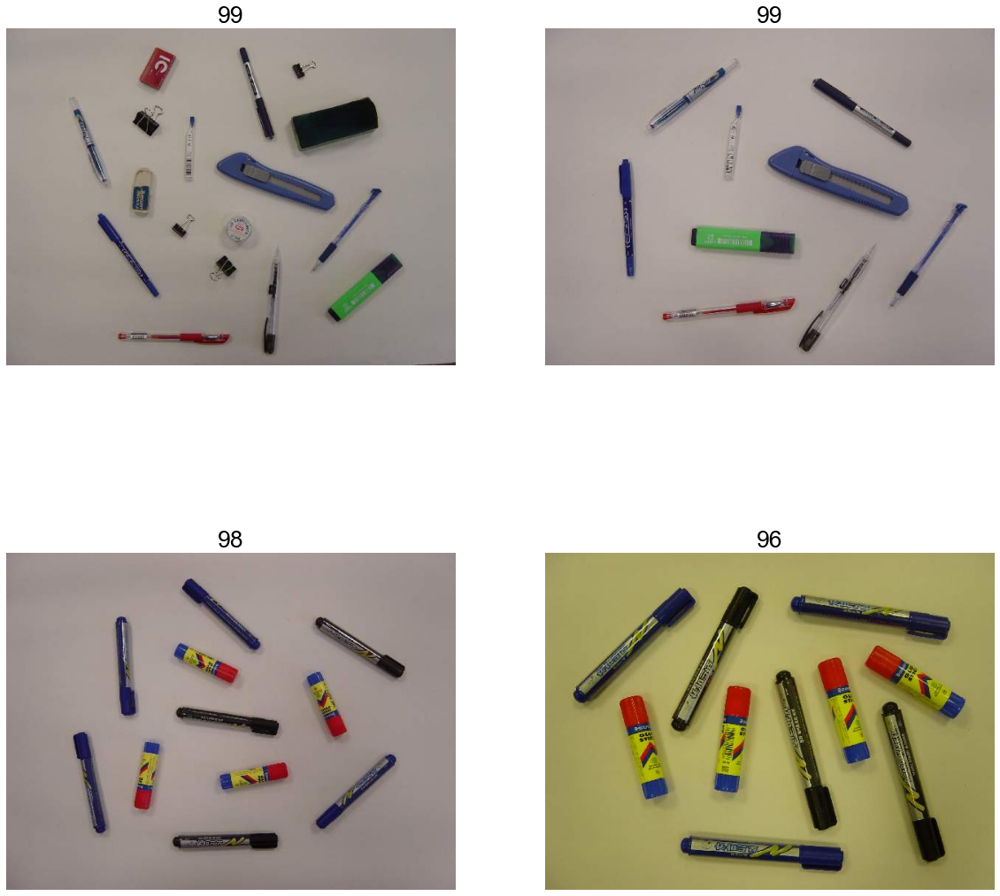

In [566]:
nums=[count_from_bin(image) for image in bin_images]
display(images,None,nums)

# II.3. ANALYSIS:

D:\Users\User\anaconda3\envs\HIPC\lib\site-packages\ipykernel_launcher.py:63: RuntimeWarning: divide by zero encountered in log


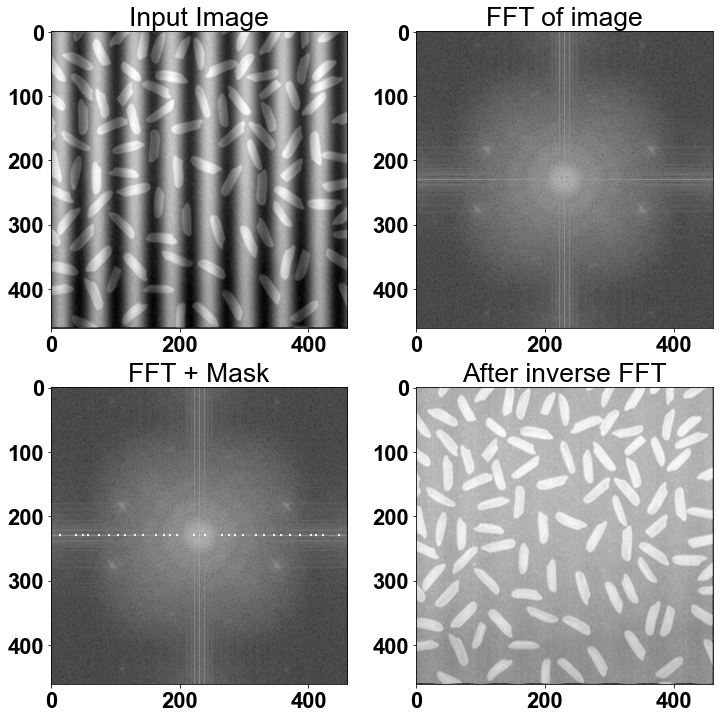

In [501]:
#Video Playlist: https://www.youtube.com/playlist?list=PLHae9ggVvqPgyRQQOtENr6hK0m1UquGaG

import cv2
from matplotlib import pyplot as plt
import numpy as np
from scipy import ndimage as ndi
import matplotlib.pyplot as plt
from skimage.feature import peak_local_max
from skimage import data, img_as_float

'''
- https://scikit-image.org/docs/dev/auto_examples/segmentation/plot_peak_local_max.html
'''


o = cv2.imread(f"{PATH_DATA_SET_001}/1_wIXlvBeAFtNVgJd49VObgQ_sinus.png")
img = cv2.cvtColor(o, cv2.COLOR_RGB2GRAY)

#Output is a 2D complex array. 1st channel real and 2nd imaginary
#For fft in opencv input image needs to be converted to float32
dft = cv2.dft(np.float32(img), flags=cv2.DFT_COMPLEX_OUTPUT)

#Rearranges a Fourier transform X by shifting the zero-frequency 
#component to the center of the array.
#Otherwise it starts at the tope left corenr of the image (array)
dft_shift = np.fft.fftshift(dft)

##Magnitude of the function is 20.log(abs(f))
#For values that are 0 we may end up with indeterminate values for log. 
#So we can add 1 to the array to avoid seeing a warning. 
magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]))

rows, cols = img.shape
crow, ccol = int(rows / 2), int(cols / 2)
mask = np.ones((rows, cols, 2), np.uint8)

'''
Find A:
'''
# im = img_as_float(data.coins())
im=magnitude_spectrum

# image_max is the dilation of im with a 20*20 structuring element
# It is used within peak_local_max function
image_max = ndi.maximum_filter(im, size=5, mode='constant')

# Comparison between image_max and im to find the coordinates of local maxima
coordinates = peak_local_max(im, min_distance=5)

cs=check_sym(coordinates)

    
for c in cs:
    if c[0]==230:
        mask[c[0],c[1]]=[0,0]


# apply mask and inverse DFT: Multiply fourier transformed image (values)
#with the mask values. 
fshift = dft_shift * mask

#Get the magnitude spectrum (only for plotting purposes)
fshift_mask_mag = 20 * np.log(cv2.magnitude(fshift[:, :, 0], fshift[:, :, 1]))

#Inverse shift to shift origin back to top left.
f_ishift = np.fft.ifftshift(fshift)

#Inverse DFT to convert back to image domain from the frequency domain. 
#Will be complex numbers
img_back = cv2.idft(f_ishift)

#Magnitude spectrum of the image domain
img_back = cv2.magnitude(img_back[:, :, 0], img_back[:, :, 1])

fig = plt.figure(figsize=(12, 12))
ax1 = fig.add_subplot(2,2,1)
ax1.imshow(img, cmap='gray')
ax1.title.set_text('Input Image')
ax2 = fig.add_subplot(2,2,2)
ax2.imshow(magnitude_spectrum, cmap='gray')
ax2.title.set_text('FFT of image')
ax3 = fig.add_subplot(2,2,3)
ax3.imshow(fshift_mask_mag, cmap='gray')
ax3.title.set_text('FFT + Mask')
ax4 = fig.add_subplot(2,2,4)
ax4.imshow(img_back, cmap='gray')
ax4.title.set_text('After inverse FFT')
plt.show()

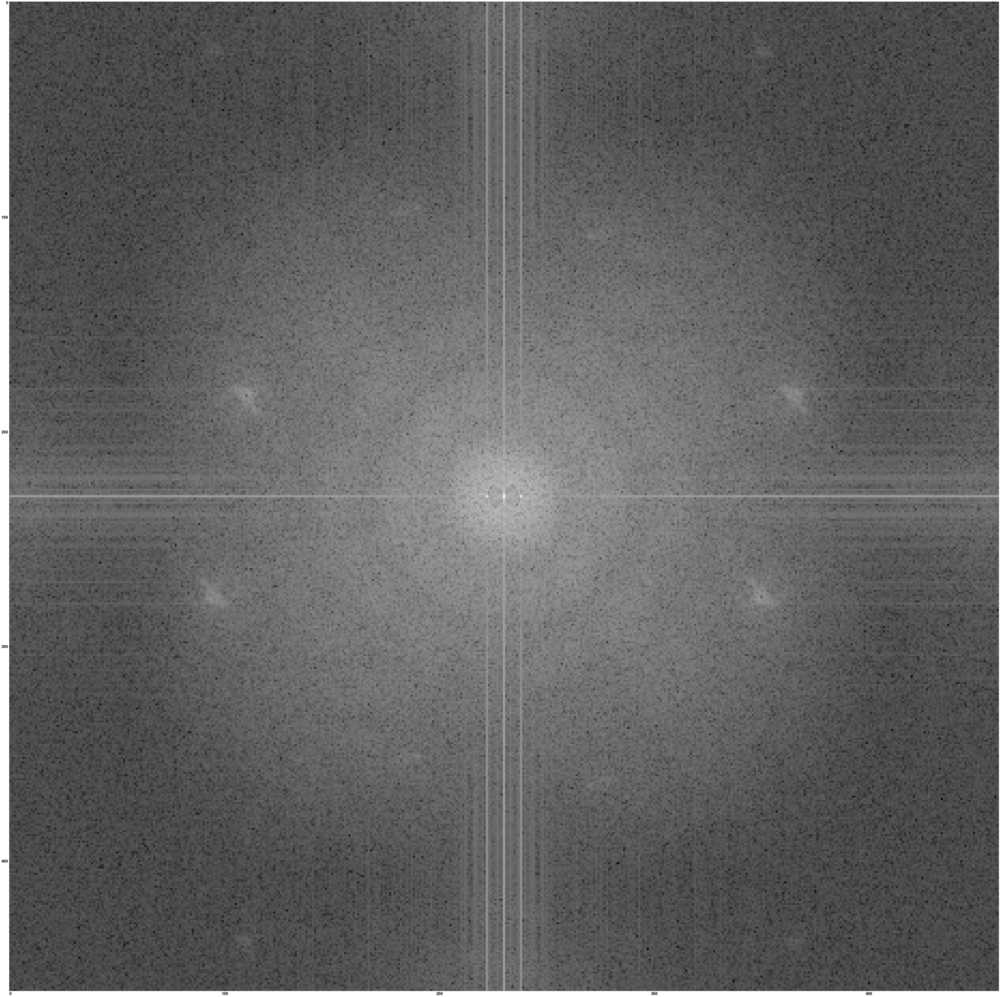

In [502]:
fig = plt.figure(figsize=(100, 100))
plt.imshow(magnitude_spectrum,cmap="gray")

# III. SET II: 

# III.1. UTILS: 

In [563]:
def to_edges(image): 
    edges = cv2.Canny(image,20,100)
    return edges

def dilate(image):
    kernel = np.ones((7,7),np.uint8)
    dilation = cv2.dilate(image,kernel,iterations = 1)
    return dilation

# III.2. PIPELINE:

# III.2.1. LOAD IMAGES: 

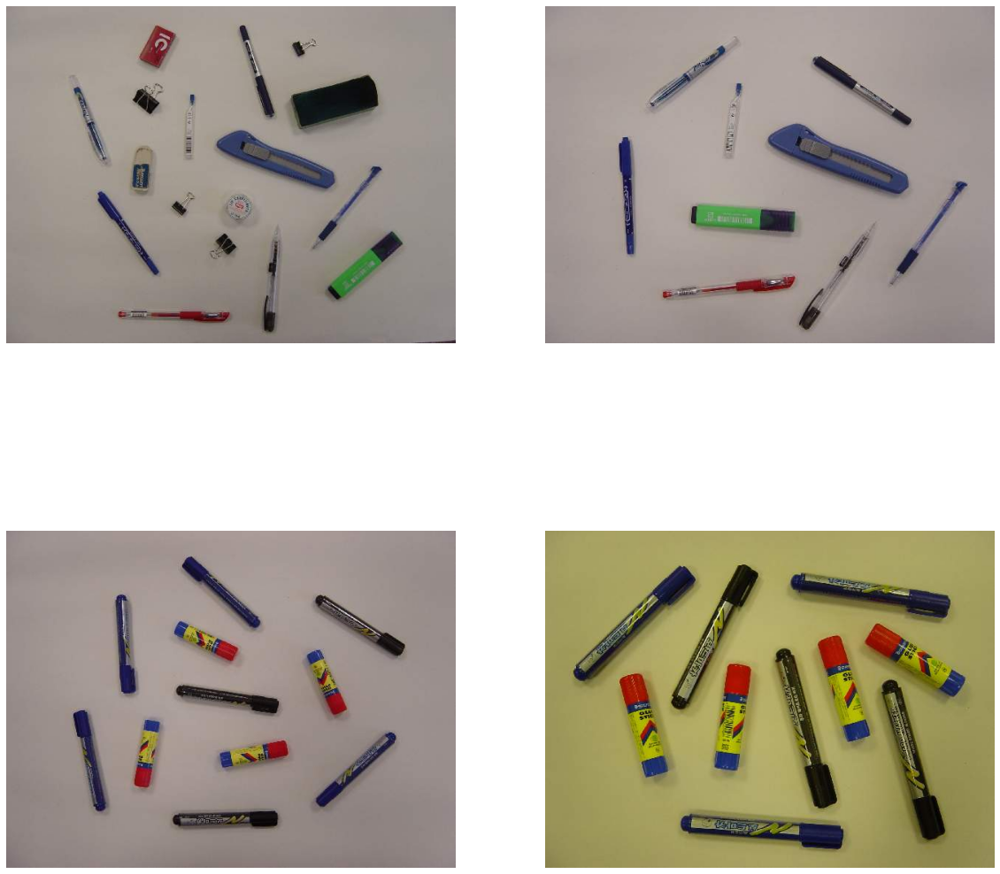

In [534]:
images=load_images_from_dir(PATH_DATA_SET_002)
display(images)

# III.2.1. CONVERT TO GRAYSCALE:

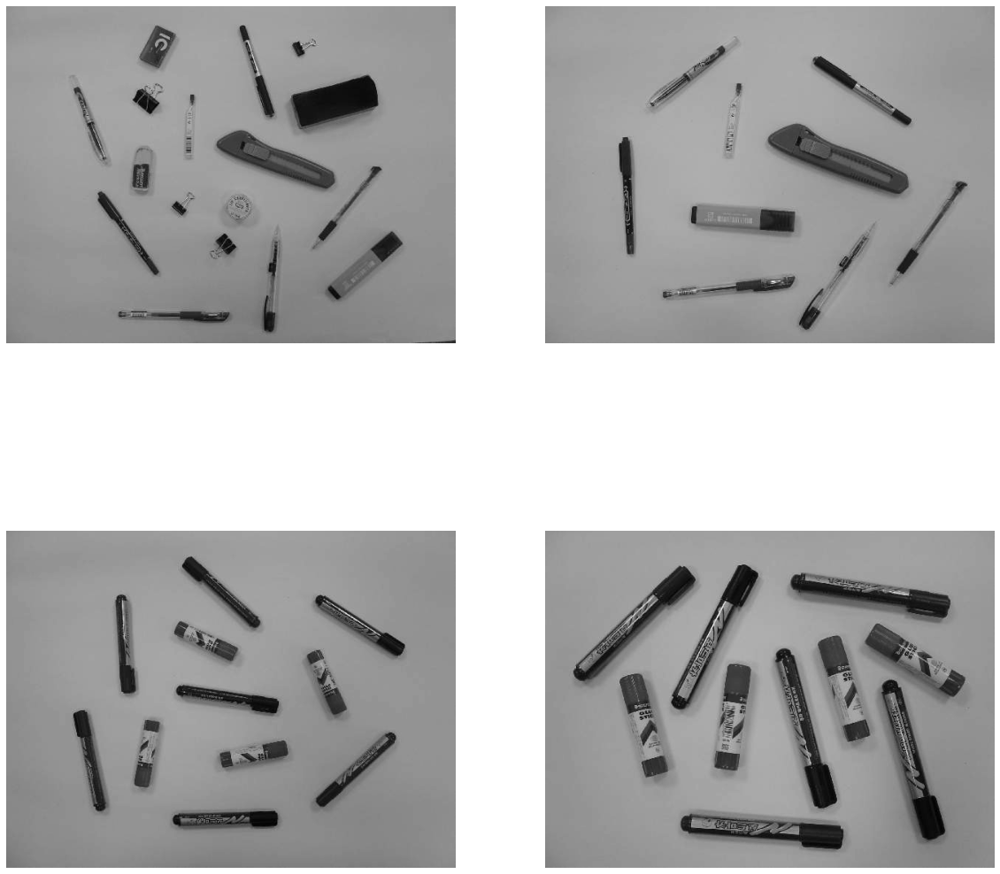

In [539]:
gray_images=[to_gray(image) for image in images]
display(gray_images,"gray")

# III.2.3. DETECT EDGES:

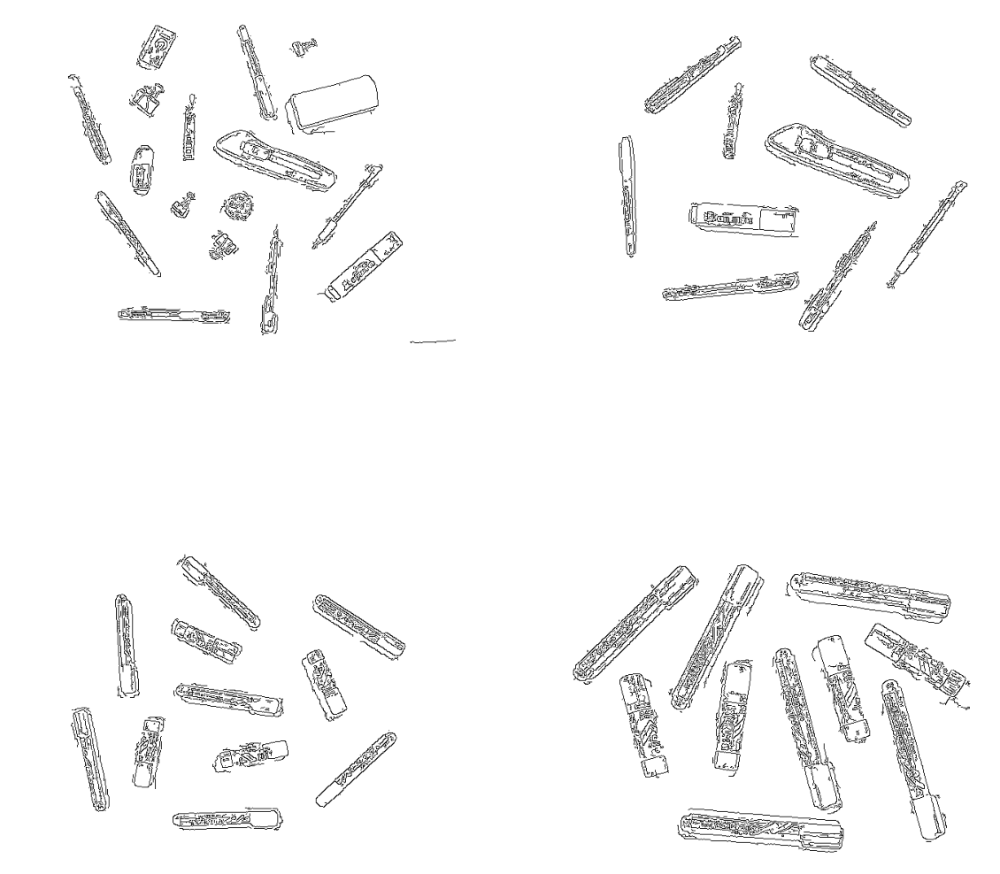

In [561]:
edge_images=[to_edges(image) for image in gray_images]
display(edge_images,"binary")

# III.2.4. DILATE:

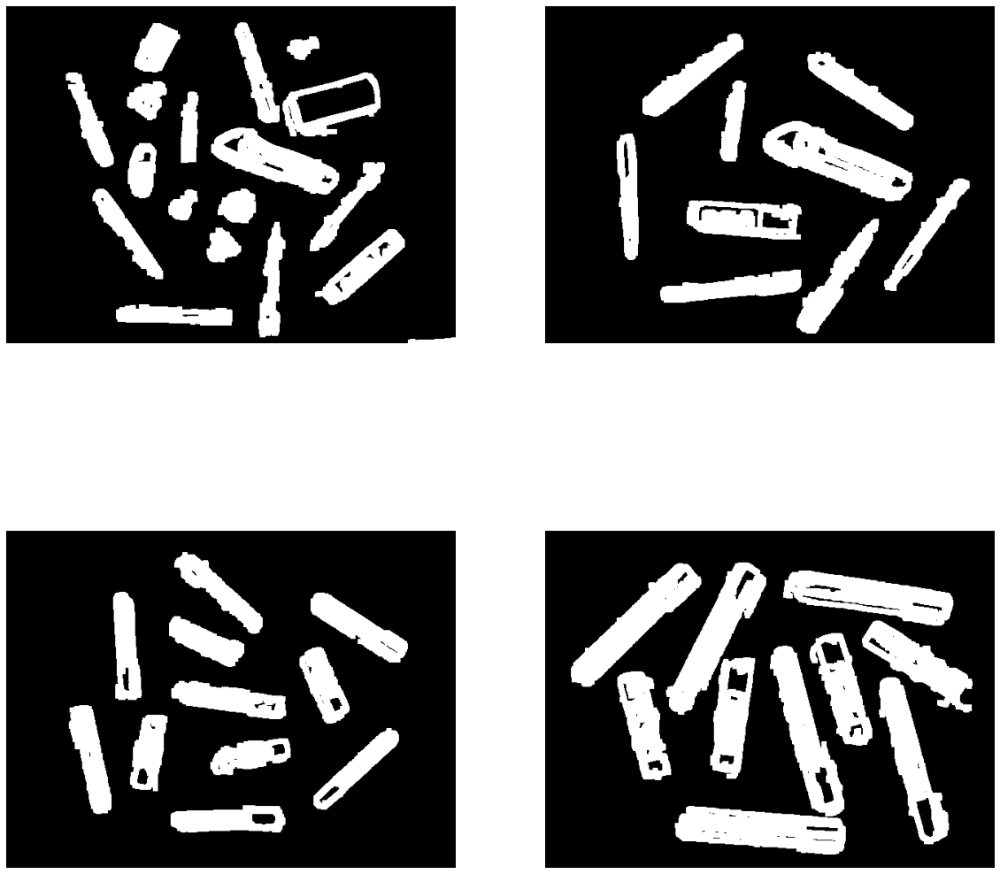

In [572]:
dilated_images=[dilate(image) for image in edge_images]
display(dilated_images,"gray")

# III.2.5. COUNT: 

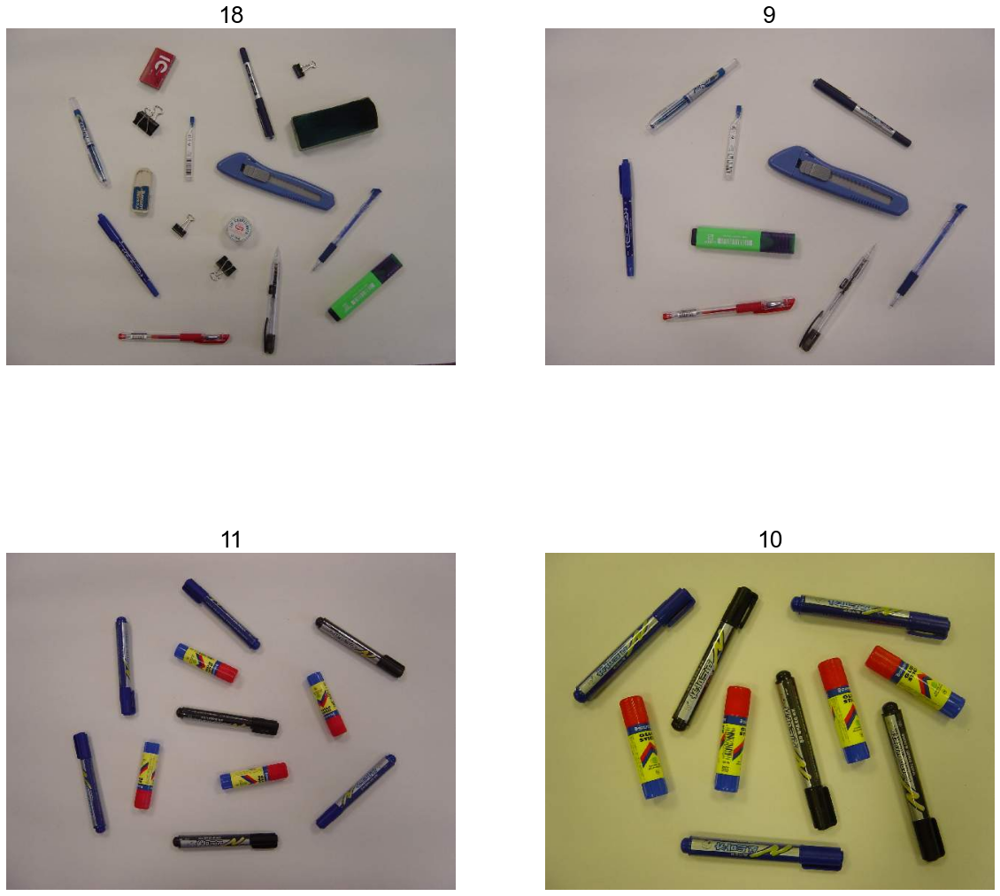

In [570]:
nums=[count_from_bin(image) for image in dilated_images]
display(images,None,nums)